<a href="https://colab.research.google.com/github/azfarkhoja305/GANs/blob/main/notebooks/DC_GAN_CIFAR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

DC GAN adopted from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

Calculates FID score in PyTorch

In [1]:
import os
import sys
from pathlib import Path
import pdb

Path.ls = lambda x: list(x.iterdir())

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchsummary import summary

In [3]:
!git clone https://github.com/azfarkhoja305/GANs.git

Cloning into 'GANs'...
remote: Enumerating objects: 175, done.
remote: Counting objects: 100% (175/175), done.
remote: Compressing objects: 100% (127/127), done.
remote: Total 175 (delta 88), reused 109 (delta 47), pack-reused 0
Receiving objects: 100% (175/175), 32.10 MiB | 13.95 MiB/s, done.
Resolving deltas: 100% (88/88), done.


In [4]:
if Path('./GANs').exists():
    sys.path.insert(0,'./GANs')

In [5]:
!python ./GANs/create_fid_stats.py -d cifar_10 -t False

Namespace(dataset='cifar_10', save='fid_stats', train='False')
170499072it [00:05, 29330719.36it/s]                   
Extracting data/cifar_10/cifar-10-python.tar.gz to data/cifar_10
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100% 91.2M/91.2M [00:04<00:00, 20.0MB/s]
100% 100/100 [00:21<00:00,  4.59it/s]
done


In [6]:
from datasets import ImageDataset
from utils.utils import check_gpu, display_images

In [7]:
%load_ext autoreload
%autoreload 2

In [8]:
device = check_gpu()
print(f'Using device: {device}')

Using device: cuda


In [9]:
dataset =  ImageDataset('cifar_10', batch_sz = 256)

Files already downloaded and verified


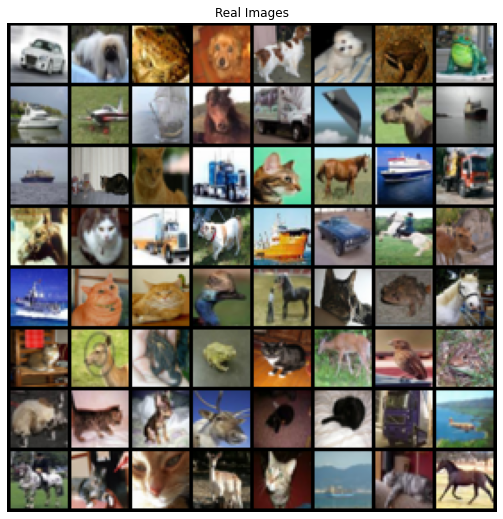

In [10]:
display_images(dataset.train_loader)

In [11]:
from models.generator import Generator
Gen = Generator().to(device)
# summary(Gen,(128,1))

In [12]:
# ViT Discriminator
from models.ViT_discriminator import Discriminator
from types import SimpleNamespace
args = SimpleNamespace(**{"d_depth": 7, "df_dim": 384, "img_size": 32, "patch_size": 8})
Dis = Discriminator(args).to(device)
# summary(Dis,(3,32,32))

In [13]:
loss_fn = nn.BCEWithLogitsLoss()
fixed_noise = torch.randn(64, 128, device=device)
real_label = 1.
fake_label = 0.
lr,beta1 = 3e-4, 0
optG = optim.AdamW(Gen.parameters(), lr=lr, betas=(beta1, 0.999))
optD = optim.AdamW(Dis.parameters(), lr=lr, betas=(beta1, 0.999))

In [14]:
img_list = []
G_losses = []
D_losses = []
iters = 0

# Number of training epochs
num_epochs = 30

In [15]:
from utils.loss import wgangp_eps_loss

for epoch in range(num_epochs):
    for i, data in enumerate(dataset.train_loader):

        ## Train with all-real batch
        Dis.zero_grad()
        # Format batch
        real = data[0].to(device)
        b_size = real.size(0)
        real_validity = torch.full(
            (b_size,), real_label, dtype=torch.float, device=device
        )
        # Forward pass real batch through D
        output_real = Dis(real).view(-1)

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, 128, 1, 1, device=device)
        # Generate fake image batch with G
        fake = Gen(noise)
        fake_validity = torch.full_like(real_validity, fake_label)
        # Classify all fake batch with D
        output_fake = Dis(fake.detach()).view(-1)

        errD = wgangp_eps_loss(Dis, real, fake, 1.0, output_real, output_fake)

        errD.backward()

        torch.nn.utils.clip_grad_norm_(Dis.parameters(), 5.0)

        # Update D
        optD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        Gen.zero_grad()
        label = torch.full_like(
            real_validity, real_label
        )  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = Dis(fake).view(-1)
        # Calculate G's loss based on this output
        errG = loss_fn(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = torch.sigmoid(output).mean().item()
        # Update G
        optG.step()

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())


        # Output training stats
        if (i+1) %100 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                % (epoch, num_epochs, i, len(dataset.train_loader),
                     errD.item(), errG.item()))

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataset.train_loader)-1)):
            with torch.no_grad():
                fake = Gen(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters +=1
      

    # _, axs = plt.subplots(1,2,figsize=(15,15))
    # display_images(dataset.train_loader,ax = axs[0])
    # display_images(img_list, ax = axs[1])
    # plt.tight_layout()
             

[0/30][99/196]	Loss_D: 0.5240	Loss_G: 1.9973
[1/30][99/196]	Loss_D: 0.6936	Loss_G: 1.2848
[2/30][99/196]	Loss_D: 0.5536	Loss_G: 0.9489
[3/30][99/196]	Loss_D: -0.2958	Loss_G: 2.4717
[4/30][99/196]	Loss_D: 0.7157	Loss_G: 1.0868
[5/30][99/196]	Loss_D: 0.2245	Loss_G: 0.5534
[6/30][99/196]	Loss_D: 0.5146	Loss_G: 0.8796
[7/30][99/196]	Loss_D: 0.5063	Loss_G: 0.7704
[8/30][99/196]	Loss_D: 0.2308	Loss_G: 0.8261
[9/30][99/196]	Loss_D: 0.2391	Loss_G: 0.8792
[10/30][99/196]	Loss_D: 0.3099	Loss_G: 0.7511
[11/30][99/196]	Loss_D: 0.2895	Loss_G: 0.9114
[12/30][99/196]	Loss_D: 0.0519	Loss_G: 0.8841
[13/30][99/196]	Loss_D: 0.0428	Loss_G: 0.7198
[14/30][99/196]	Loss_D: 1.0530	Loss_G: 0.4714
[15/30][99/196]	Loss_D: 0.2123	Loss_G: 0.9470
[16/30][99/196]	Loss_D: 0.1285	Loss_G: 0.9061
[17/30][99/196]	Loss_D: 0.1514	Loss_G: 0.8222
[18/30][99/196]	Loss_D: 0.0869	Loss_G: 0.9134
[19/30][99/196]	Loss_D: 0.1799	Loss_G: 0.8436
[20/30][99/196]	Loss_D: 0.0434	Loss_G: 0.9680
[21/30][99/196]	Loss_D: 0.1305	Loss_G: 0.88

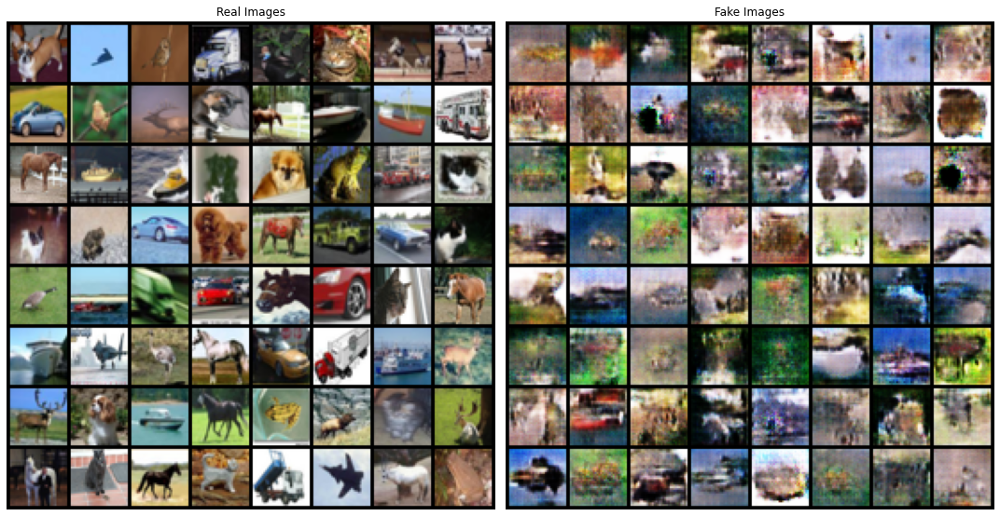

In [16]:
_, axs = plt.subplots(1,2,figsize=(15,15))
display_images(dataset.train_loader,ax = axs[0])
display_images(img_list, ax = axs[1])
plt.tight_layout()

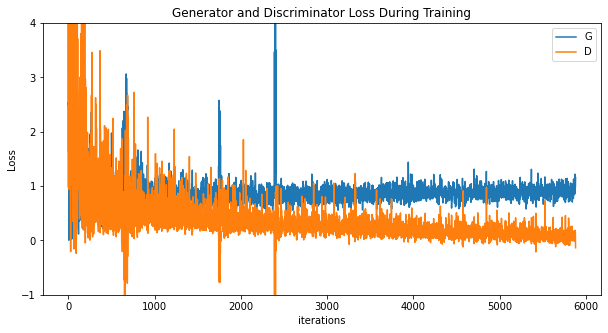

In [24]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.ylim([-1,4])
plt.legend()
plt.show()

Calculating FID Score

In [18]:
from utils.torch_fid_score import get_fid

In [19]:
stat_path = Path('fid_stats/cifar_10_valid_fid_stats.npz')
score = get_fid(Gen, 128, 10000, 256, stat_path)
print(f"\nFID score: {score}")

Propagating batch 100/100
done

FID score: 126.61004638671875


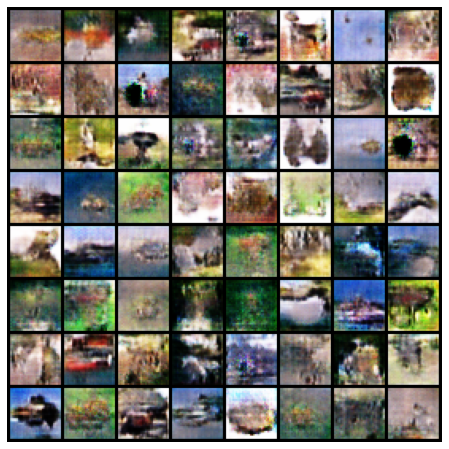

In [20]:
rc('animation', html='jshtml')
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
ani